## Get markers from original atlas with extended annotation

In [1]:
here::i_am("rna/regression/regress_variables.R")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(edgeR))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 16

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [226]:
args = list()
args$celltypes = c("Epiblast",
        "Primitive Streak",
        "Caudal epiblast",
        "PGC",
        "Anterior Primitive Streak",
        "Nascent mesoderm",
        "Intermediate mesoderm",
        "Caudal mesoderm",
        "Lateral plate mesoderm",
        "Limb mesoderm",
        "Forelimb",
        "Kidney primordium",
        "Presomitic mesoderm",
        "Somitic mesoderm",
        "Posterior somitic tissues",
        "Paraxial mesoderm",
        "Cranial mesoderm",
        "Anterior somitic tissues",
        "Sclerotome",
        "Dermomyotome",
        "Pharyngeal mesoderm",
        "Cardiopharyngeal progenitors",
        "Anterior cardiopharyngeal progenitors",
        "Allantois",
        "Mesenchyme",
        "YS mesothelium",
        "Epicardium",
        "Embryo proper mesothelium",
        "Cardiopharyngeal progenitors FHF",
        "Cardiomyocytes FHF 1",
        "Cardiomyocytes FHF 2",
        "Cardiopharyngeal progenitors SHF",
        "Cardiomyocytes SHF 1",
        "Cardiomyocytes SHF 2",
        "Haematoendothelial progenitors",
        "Blood progenitors",
        "Erythroid",
        "Chorioallantoic-derived erythroid progenitors",
        "Megakaryocyte progenitors",
        "MEP",
        "EMP",
        "YS endothelium",
        "YS mesothelium-derived endothelial progenitors",
        "Allantois endothelium",
        "Embryo proper endothelium",
        "Venous endothelium",
        "Endocardium",
        "NMPs/Mesoderm-biased",
        "NMPs"
)
args$outdir = file.path(io$basedir, 'results/rna/marker_scores/')
dir.create(args$outdir, recursive=TRUE, showWarnings =FALSE)

In [3]:
extended.sce = readRDS(io$atlas.extended.sce)

In [4]:
meta = colData(extended.sce) %>% 
    as.data.table() %>% 
    .[embryo_version=='Original'] %>%
    .[celltype_extended_atlas %in% args$celltypes]

In [5]:
############
### TEST ###
############
#meta = meta[celltype_extended_atlas %in% c('Epiblast', 'YS endothelium', 'Primitive Streak')]

In [6]:
# Subset to original atlas
original.sce = extended.sce[,as.character(meta$cell)]

In [7]:
original.sce

class: SingleCellExperiment 
dim: 27669 72845 
metadata(0):
assays(1): counts
rownames(27669): ENSMUSG00000051951 ENSMUSG00000089699 ...
  ENSMUSG00000096730 ENSMUSG00000095742
rowData names(0):
colnames(72845): cell_1 cell_2 ... cell_139329 cell_139330
colData names(19): cell sample ... celltype_extended_atlas sizeFactor
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [8]:
# Remove genes with low total counts
counts = rowSums(assay(original.sce))
original.sce = original.sce[names(counts[counts>=30]),]

In [9]:
# Rename ensemble IDs to gene names in the atlas
gene_metadata <- fread(io$gene_metadata) %>% 
    .[,c("chr","ens_id","symbol")] %>%
     .[symbol!="" & ens_id%in%rownames(original.sce)] %>%
     .[!duplicated(symbol)]

original.sce <- original.sce[rownames(original.sce) %in% gene_metadata$ens_id,]
foo <- gene_metadata$symbol; names(foo) <- gene_metadata$ens_id
rownames(original.sce) <- foo[rownames(original.sce)]

In [10]:
original.sce

class: SingleCellExperiment 
dim: 17109 72845 
metadata(0):
assays(1): counts
rownames(17109): Xkr4 Sox17 ... mt-Nd6 mt-Cytb
rowData names(0):
colnames(72845): cell_1 cell_2 ... cell_139329 cell_139330
colData names(19): cell sample ... celltype_extended_atlas sizeFactor
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [39]:
# Pseudobulk by celltype.extended + sample
summed <- aggregateAcrossCells(original.sce, 
    id=colData(original.sce)[,c("celltype_extended_atlas", "sample")],
    BPPARAM = BPPARAM)
summed

class: SingleCellExperiment 
dim: 17109 746 
metadata(0):
assays(1): counts
rownames(17109): Xkr4 Sox17 ... mt-Nd6 mt-Cytb
rowData names(0):
colnames: NULL
colData names(22): cell sample ... sample ncells
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [40]:
# Filter pseudobulks
summed.filt <- summed[,summed$ncells >= 15]

# Additionally remove useless genes
summed.filt <- summed.filt[grep("*Rik|^Gm|^Mt-|^Rps|^Rpl|^Olfr",rownames(summed.filt), invert=T),]

In [43]:
saveRDS(summed.filt, sprintf('%s/summed_filt.rds', args$outdir))

In [44]:
# Write function to compare each celltype vs all
DEGs_celltype = function(celltype = 'Epiblast'){
    message(celltype)
    tmp = summed.filt
    tmp$DEG = ifelse(tmp$celltype_extended_atlas == celltype, 'test', 'background')
    
    between.res <- pseudoBulkDGE(tmp,
                    label=rep("dummy", ncol(tmp)),
                    design=~factor(sample) + DEG,
                    coef="DEGtest")[[1]] %>% 
                         as.data.table(., keep.rownames=T) %>% 
                        setnames('rn', 'gene') %>%
                        .[order(FDR)] %>% 
                        .[,sig:=ifelse(abs(logFC)>1.25 & FDR<0.05, TRUE, FALSE)] %>%
                        .[sig==TRUE] %>%
                        .[,celltype:=celltype]
    return(between.res)
}

In [84]:
# mclapply function for every celltype & combine into one data frame
out = mclapply(c('Epiblast'), DEGs_celltype, mc.cores=16) %>%
    rbindlist()

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [85]:
out2 = out

In [86]:
add_cdr = function(celltype_i = 'Epiblast', DEGs = DEGs_tmp){

    DEGs_tmp = DEGs[celltype == celltype_i]
    tmp = original.sce[DEGs_tmp$gene,original.sce$celltype_extended_atlas == celltype_i]
    cdr = round(rowSums(counts(tmp) > 0) / ncol(tmp), 2)
    
    tmp.bg = original.sce[DEGs_tmp$gene,original.sce$celltype_extended_atlas != celltype_i]
    cdr.bg = round(rowSums(counts(tmp.bg) > 0) / ncol(tmp.bg), 2)

    DEGs_tmp = DEGs_tmp[,`:=`(cdr=cdr, cdr_bg = cdr.bg)]
    return(DEGs_tmp)
}

In [169]:
out3 = mclapply(c('Epiblast', 'Primitive Streak'), add_cdr,  DEGs = DEGs, mc.cores=16) %>% 
    rbindlist()
head(out3)

gene,logFC,logCPM,F,PValue,FDR,sig,celltype,FDR_cap,cdr,cdr_bg
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>
Utf1,3.916881,6.3411980,260.2686,5.536955e-47,6.627182e-43,TRUE,Epiblast,5e-16,1.00,0.18
Pou3f1,3.454437,4.6367008,246.9144,4.088568e-45,2.446803e-41,TRUE,Epiblast,5e-16,0.86,0.11
Grp,3.812314,1.6169555,220.1055,3.539322e-41,1.129207e-37,TRUE,Epiblast,5e-16,0.16,0.01
Kcnh8,3.416219,0.6570576,201.5023,2.192274e-36,4.373221e-33,TRUE,Epiblast,5e-16,0.02,0.00
Marveld3,3.132631,1.5658026,170.7182,1.534631e-33,2.582336e-30,TRUE,Epiblast,5e-16,0.14,0.01
Slc7a3,3.675586,5.2187453,165.4918,1.077147e-32,1.432486e-29,TRUE,Epiblast,5e-16,0.93,0.16


In [ ]:
# # Save all significant hits
# fwrite(out, sprintf('%s/celltype_extended_markers.txt.gz', args$outdir))

In [ ]:
# Try getting a score similar to Ricard

In [90]:
getwd()

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code/rna/marker_scores"

In [11]:
DEGs = fread('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna/marker_scores/celltype_extended_markers.txt.gz' )

In [17]:
unique(DEGs$celltype)

[1] "Allantois"                            
 [2] "Allantois endothelium"                
 [3] "Anterior cardiopharyngeal progenitors"
 [4] "Anterior Primitive Streak"            
 [5] "Anterior somitic tissues"             
 [6] "Cardiomyocytes FHF 1"                 
 [7] "Cardiomyocytes FHF 2"                 
 [8] "Cardiomyocytes SHF 1"                 
 [9] "Cardiopharyngeal progenitors"         
[10] "Cardiopharyngeal progenitors FHF"     
[11] "Caudal epiblast"                      
[12] "Caudal mesoderm"                      
[13] "Dermomyotome"                         
[14] "Embryo proper endothelium"            
[15] "Embryo proper mesothelium"            
[16] "EMP"                                  
[17] "Endocardium"                          
[18] "Epicardium"                           
[19] "Erythroid"                            
[20] "Haematoendothelial progenitors"       
[21] "Kidney primordium"                    
[22] "Lateral plate mesoderm"               
[23] "MEP"                                  
[24] "Mesenchyme"                           
[25] "NMPs"                                 
[26] "NMPs/Mesoderm-biased"                 
[27] "Paraxial mesoderm"                    
[28] "Pharyngeal mesoderm"                  
[29] "Posterior somitic tissues"            
[30] "Primitive Streak"                     
[31] "Sclerotome"                           
[32] "Somitic mesoderm"                     
[33] "YS endothelium"                       
[34] "YS mesothelium"

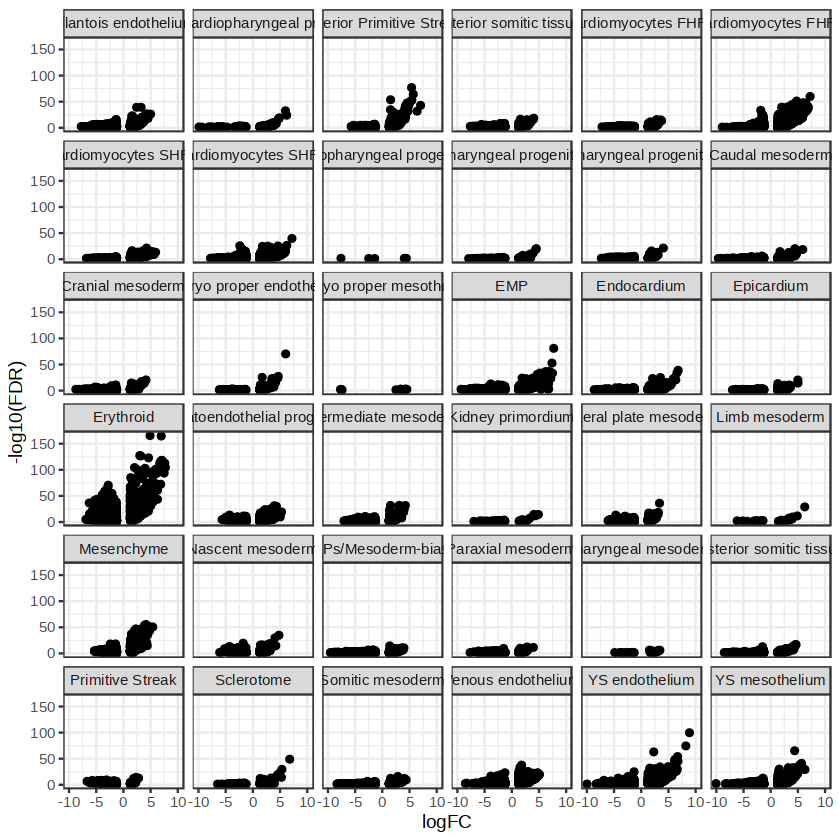

In [15]:
ggplot(DEGs[,FDR_cap:= ifelse(FDR<0.0000000000000005, 0.0000000000000005, FDR)], aes(logFC, -log10(FDR))) + 
    geom_point() +
    xlim(-max(abs(DEGs$logFC)), max(abs(DEGs$logFC))) + 
    facet_wrap(~celltype) + 
    theme_bw()

In [18]:
umap = fread('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/meta.tab') %>% 
    .[,c('cell', 'umapX', 'umapY')] %>% 
    setnames(c('cell', 'umap1', 'umap2')) %>%
   .[match(colnames(original.sce), cell)]

In [19]:
counts = counts(original.sce)

In [20]:
summary(colnames(counts) == umap$cell)

   Mode    TRUE 
logical   72845 

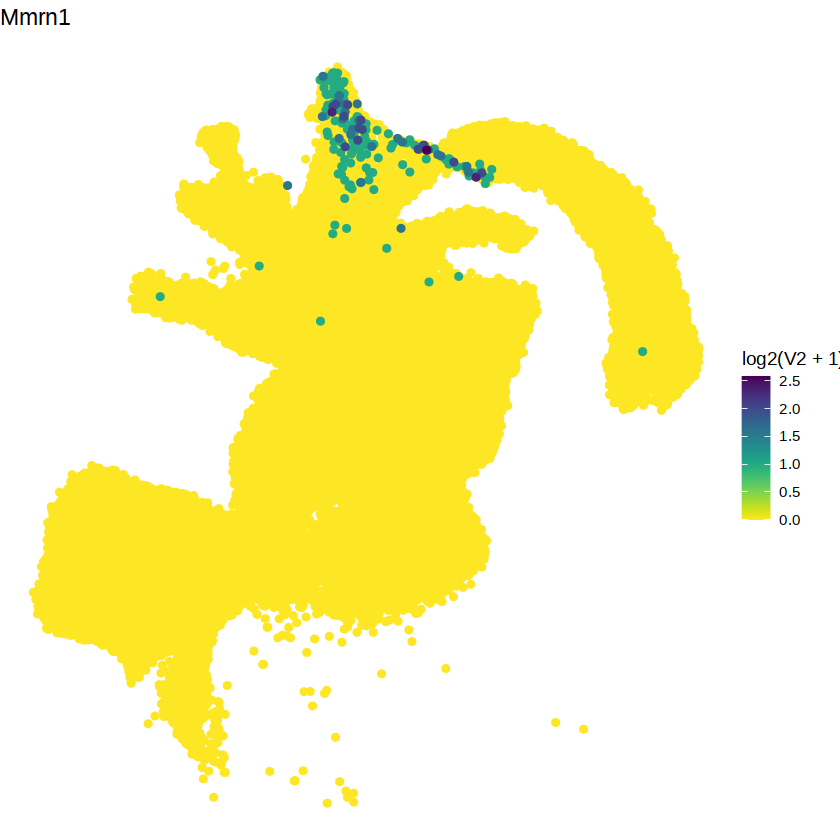

In [21]:
gene = 'Mmrn1'
tmp = cbind(umap, as.vector(counts[gene,]))[order(V2)]
ggplot(tmp, aes(umap1, umap2, col=log2(V2+1))) +
    geom_point() + 
    viridis::scale_color_viridis(begin=1, end=0) + 
    ggtitle(gene) + 
    theme_void()

In [205]:
summary(umap$cell == meta$cell)

   Mode    TRUE 
logical   72845 

In [22]:
umap$celltype = meta$celltype_extended_atlas

In [23]:
out4 = DEGs[order(-logFC)][,cdr_diff:=cdr-cdr_bg][cdr_diff>0.2][order(-cdr_diff)][,comb:=logFC*cdr_diff]

# means

In [128]:
n_top = 15

In [129]:
plot_gene_score = function(genes){
    tmp = cbind(umap, as.vector(colMeans(counts[genes,])))[order(V2)]
p1 = ggplot(tmp, aes(umap1, umap2, col=log2(V2+1))) +
    geom_point() + 
    viridis::scale_color_viridis(begin=1, end=0) + 
    ggtitle(paste(genes, collapse='/')) + 
    theme_void()
    
p2 = ggplot(tmp, aes(celltype, log2(V2+1)))+
       # geom_violin() + 
        geom_boxplot() + 
        theme_bw() + 
        theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=1, color='black'))
    ggarrange(p1, p2, widths=c(1,2))
    
}

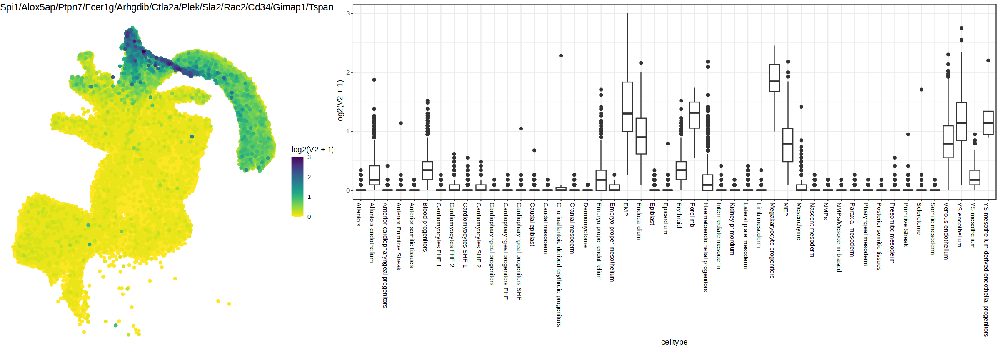

In [130]:
options(repr.plot.width=20, repr.plot.height=7)
plot_gene_score(out4[celltype=='EMP'][order(-comb)] %>% head(n_top) %>% .$gene)

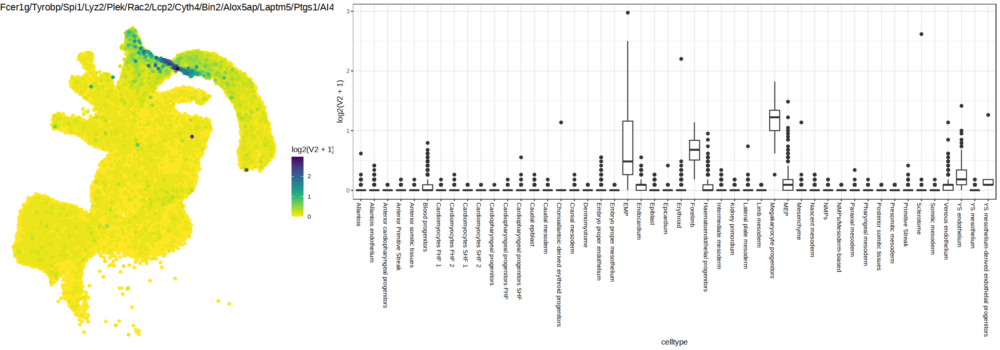

In [131]:
plot_gene_score(out4[celltype=='EMP'][order(-logFC)] %>% head(n_top) %>% .$gene)

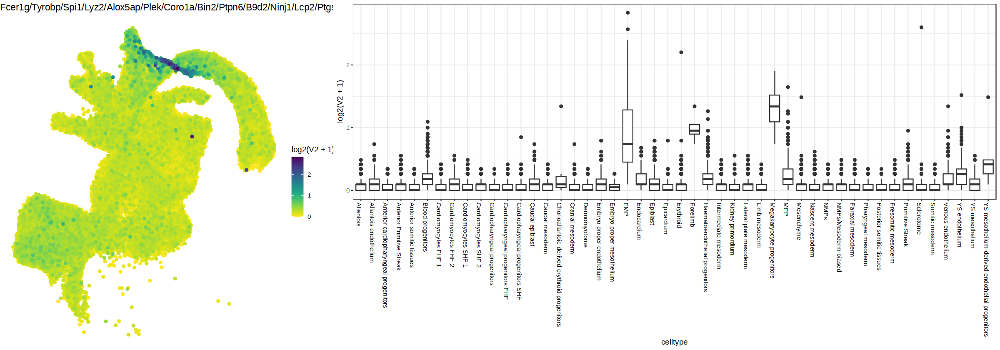

In [132]:
plot_gene_score(out4[celltype=='EMP'][order(FDR)] %>% head(n_top) %>% .$gene)

# medians

In [ ]:
n_top = 15

In [50]:
plot_gene_score = function(genes){
    tmp = cbind(umap, as.vector(colMedians(counts[genes,])))[order(V2)]
    p1 = ggplot(tmp, aes(umap1, umap2, col=log2(V2+1))) +
        geom_point() + 
        viridis::scale_color_viridis(begin=1, end=0) + 
        ggtitle(paste(genes, collapse='/')) + 
        theme_void()

    p2 = ggplot(tmp, aes(celltype, log2(V2+1)))+
           # geom_violin() + 
            geom_boxplot() + 
            theme_bw() + 
            theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=1, color='black'))
    ggarrange(p1, p2, widths=c(1,2))
    
}

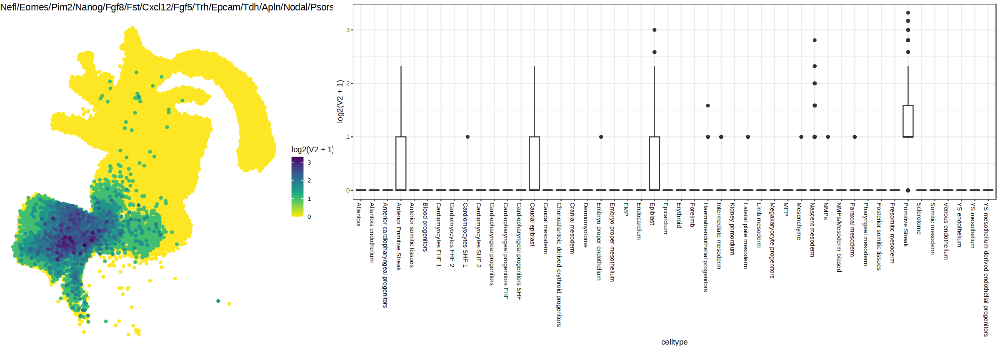

In [51]:
options(repr.plot.width=20, repr.plot.height=7)
plot_gene_score(out4[celltype=='Primitive Streak'][order(-comb)] %>% head(n_top) %>% .$gene)

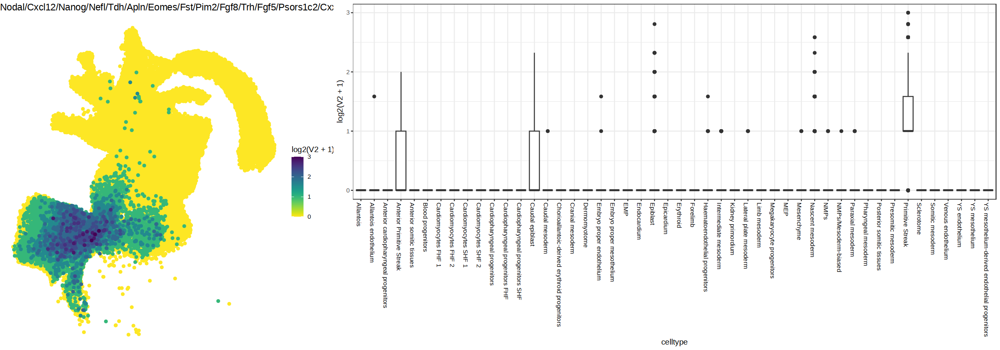

In [41]:
plot_gene_score(out4[celltype=='Primitive Streak'][order(-logFC)] %>% head(n_top) %>% .$gene)

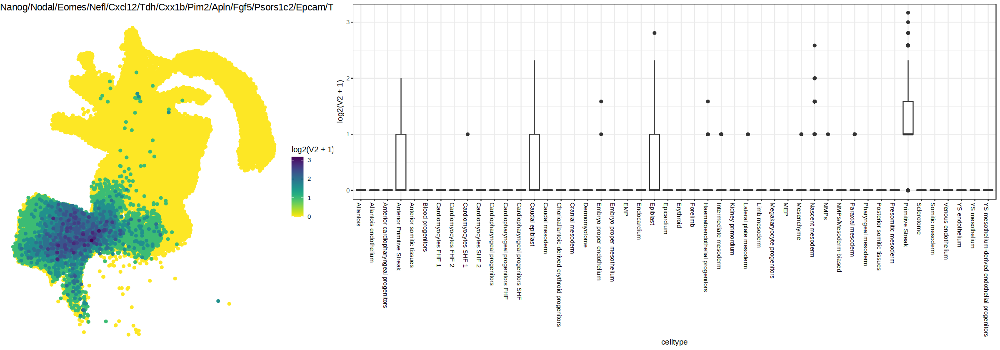

In [42]:
plot_gene_score(out4[celltype=='Primitive Streak'][order(FDR)] %>% head(n_top) %>% .$gene)

# per celltype

In [43]:
counts[1:5, 1:5]

5 x 5 sparse Matrix of class "dgCMatrix"
        cell_1 cell_2 cell_6 cell_8 cell_9
Xkr4         .      .      .      .      .
Sox17        .      .      .      .      .
Mrpl15       3     10      8      7      9
Lypla1       2      1      2      1      2
Gm37988      .      .      .      .      .

In [49]:
plot_gene_score = function(celltypei='Epiblast'){
    n_top = 15
    genes = out4[celltype==celltypei,] %>%
        .[order(-logFC)] %>% 
        .[logFC>0] %>%
        head(n_top) %>% 
        .$gene
    
#    print(genes)
    tmp = cbind(umap, as.vector(colMedians(counts[genes,])))[order(V2)]
    p1 = ggplot(tmp, aes(umap1, umap2, col=log2(V2+1))) +
        geom_point() + 
        viridis::scale_color_viridis(begin=1, end=0) + 
        ggtitle(celltypei) + 
        theme_void()

    p2 = ggplot(tmp, aes(celltype, log2(V2+1)))+
           # geom_violin() + 
            geom_boxplot() + 
            theme_bw() + 
            xlab('') +
            theme(axis.text.x=element_text(angle=-90, hjust=0, vjust=1, color='black'))
    ggarrange(p1, p2, widths=c(1,2))
    
}

In [25]:
unique(DEGs$celltype)

[1] "Allantois"                            
 [2] "Allantois endothelium"                
 [3] "Anterior cardiopharyngeal progenitors"
 [4] "Anterior Primitive Streak"            
 [5] "Anterior somitic tissues"             
 [6] "Cardiomyocytes FHF 1"                 
 [7] "Cardiomyocytes FHF 2"                 
 [8] "Cardiomyocytes SHF 1"                 
 [9] "Cardiopharyngeal progenitors"         
[10] "Cardiopharyngeal progenitors FHF"     
[11] "Caudal epiblast"                      
[12] "Caudal mesoderm"                      
[13] "Dermomyotome"                         
[14] "Embryo proper endothelium"            
[15] "Embryo proper mesothelium"            
[16] "EMP"                                  
[17] "Endocardium"                          
[18] "Epicardium"                           
[19] "Erythroid"                            
[20] "Haematoendothelial progenitors"       
[21] "Kidney primordium"                    
[22] "Lateral plate mesoderm"               
[23] "MEP"                                  
[24] "Mesenchyme"                           
[25] "NMPs"                                 
[26] "NMPs/Mesoderm-biased"                 
[27] "Paraxial mesoderm"                    
[28] "Pharyngeal mesoderm"                  
[29] "Posterior somitic tissues"            
[30] "Primitive Streak"                     
[31] "Sclerotome"                           
[32] "Somitic mesoderm"                     
[33] "YS endothelium"                       
[34] "YS mesothelium"

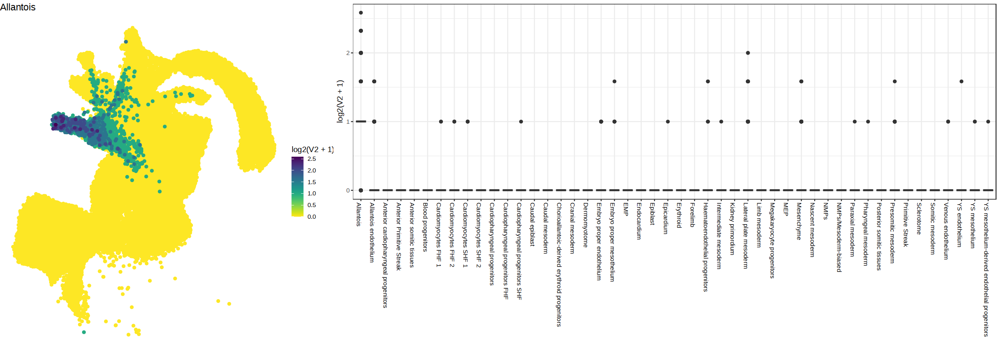

In [50]:
options(repr.plot.width=20, repr.plot.height=7)
plot_gene_score('Allantois')

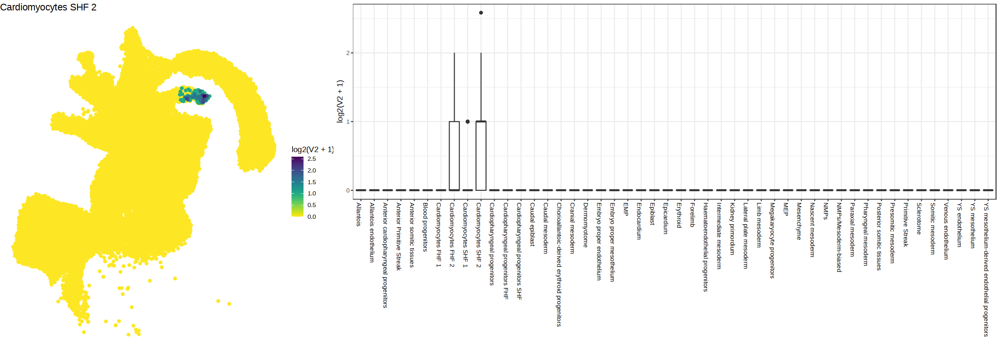

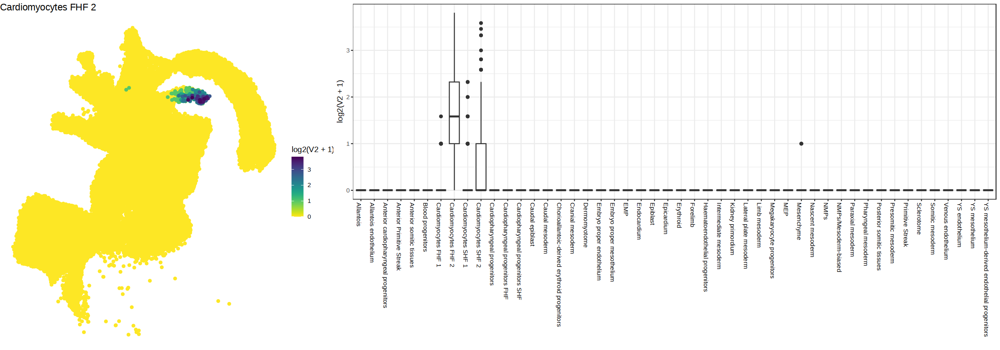

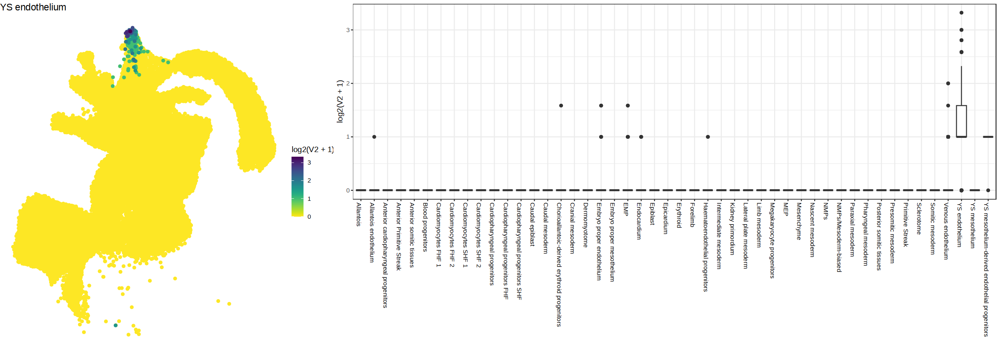

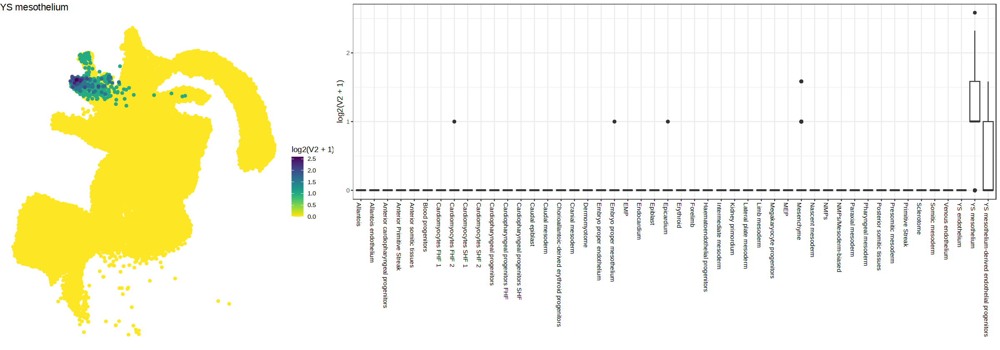

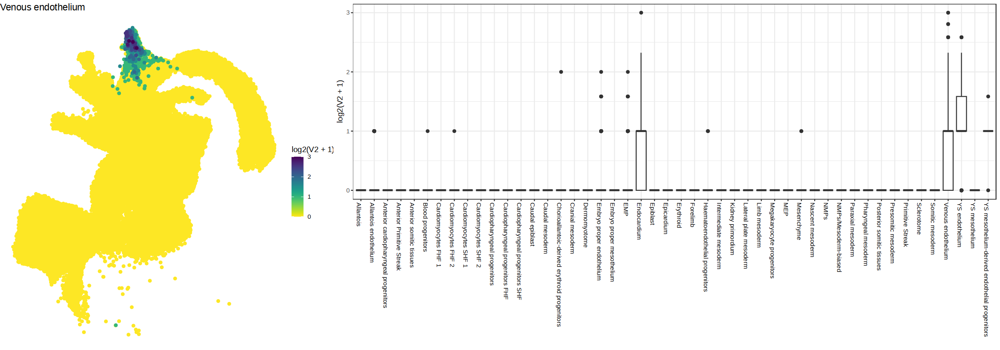

...

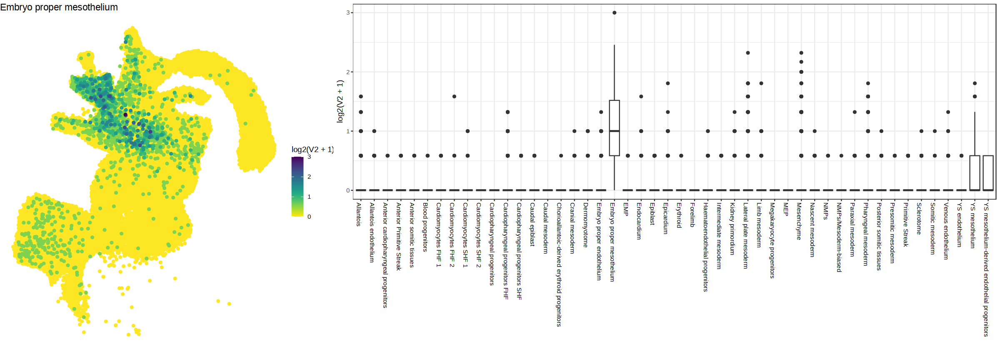

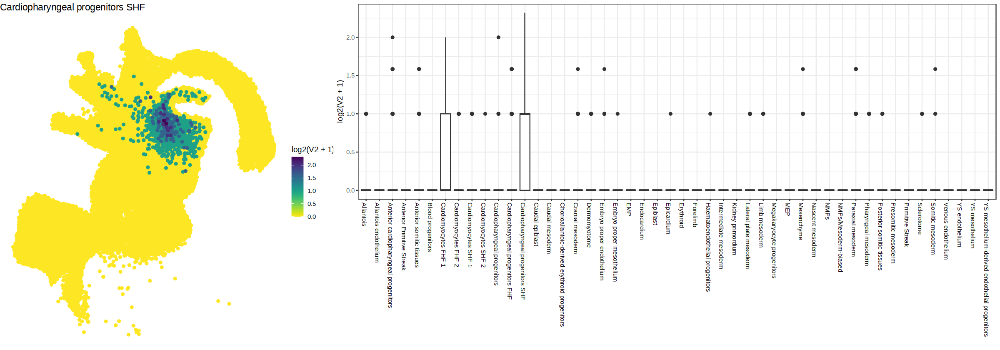

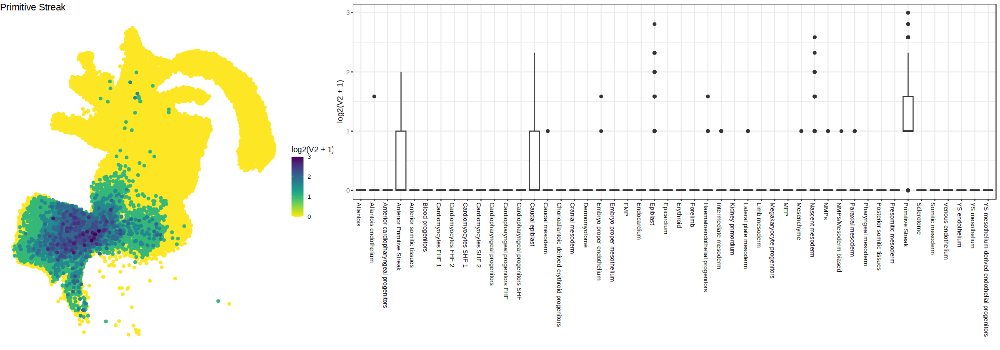

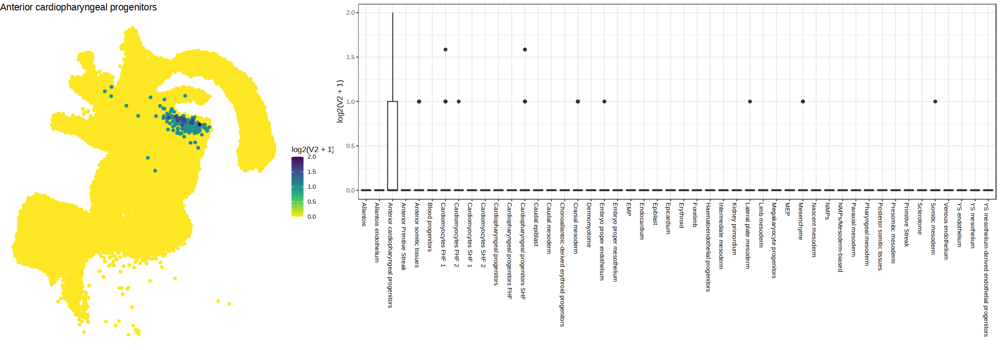

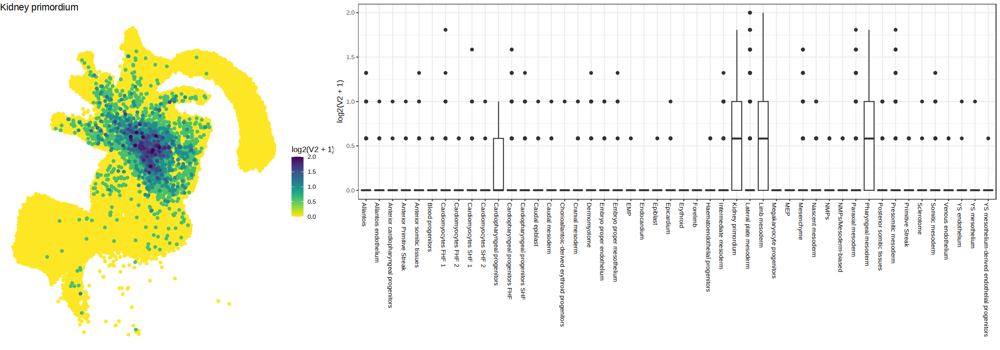

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]

[[26]]

[[27]]

[[28]]

[[29]]

[[30]]

[[31]]

[[32]]

[[33]]

[[34]]

[[35]]


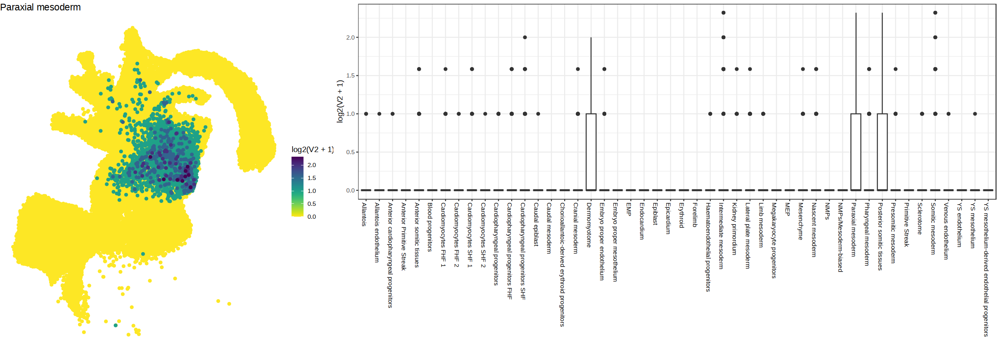

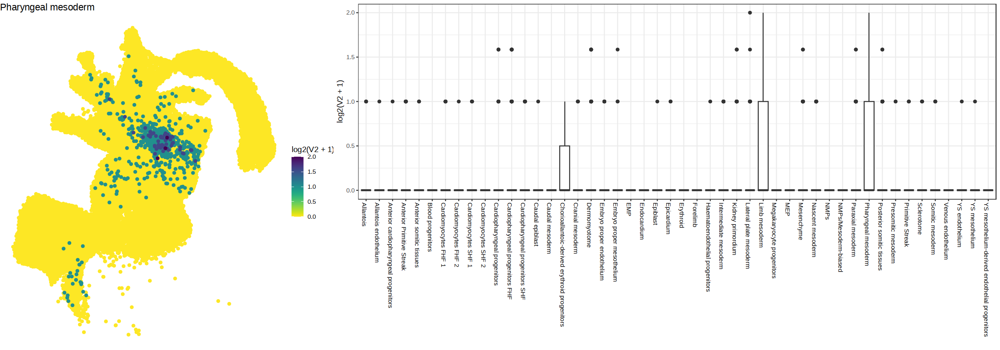

In [98]:
lapply(unique(out4$celltype), plot_gene_score)

In [51]:
minmax = function(x){
    x = (x-min(x))/(max(x)-min(x))
    return(x)
}

In [108]:
get_gene_score = function(celltypei='Epiblast'){
    n_top = 15
    genes = out4[celltype==celltypei,] %>%
        .[order(-logFC)] %>% 
        .[logFC>0] %>%
        head(n_top) %>% 
        .$gene
    
#    print(genes)
    tmp = data.table(cell = umap$cell, 
                     celltype = umap$celltype,  
                     celltype_score = celltypei,
                     score = colMedians(counts[genes,])) %>%
            .[,minmax_score:=minmax(score), by='celltype_score'] %>%
            .[,scale_score:=scale(score), by='celltype_score']
    return(tmp)
}

In [109]:
scores = mclapply(unique(out4$celltype), get_gene_score, mc.cores=24) %>%
    rbindlist()

In [101]:
scores.dt = scores[,mean_score:=mean(score), by=c('celltype', 'celltype_score')] %>%
                    .[,minmax_mean_score:=minmax(mean_score), by='celltype_score'] %>% 
            unique(by=c('celltype', 'celltype_score'))

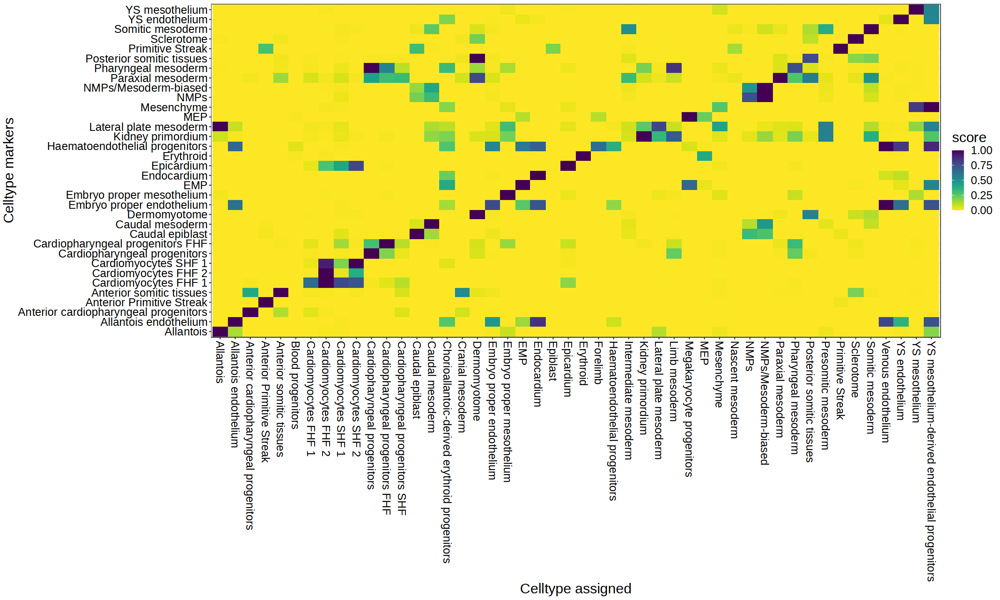

In [102]:
options(repr.plot.width=20, repr.plot.height=12)
ggplot(scores.dt, aes(celltype, celltype_score, fill=minmax_mean_score)) + 
      geom_tile() + 
      viridis::scale_fill_viridis(begin=1, end=0, name = 'score') + 
      xlab('Celltype assigned') + ylab('Celltype markers') +
      theme_bw() + 
        theme(text=element_text(size=20),
              axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5, color='black'),
              axis.text.y=element_text(color='black'))

In [82]:
head(scores.dt)

cell,celltype,celltype_score,score,mean_score,minmax_mean_score
<chr>,<fct>,<chr>,<dbl>,<dbl>,<dbl>
cell_1,Epiblast,Cardiomyocytes FHF 2,0,0,0
cell_2,Primitive Streak,Cardiomyocytes FHF 2,0,0,0
cell_263,Nascent mesoderm,Cardiomyocytes FHF 2,0,0,0
cell_363,Blood progenitors,Cardiomyocytes FHF 2,0,0,0
cell_369,Paraxial mesoderm,Cardiomyocytes FHF 2,0,0,0
cell_373,Caudal epiblast,Cardiomyocytes FHF 2,0,0,0


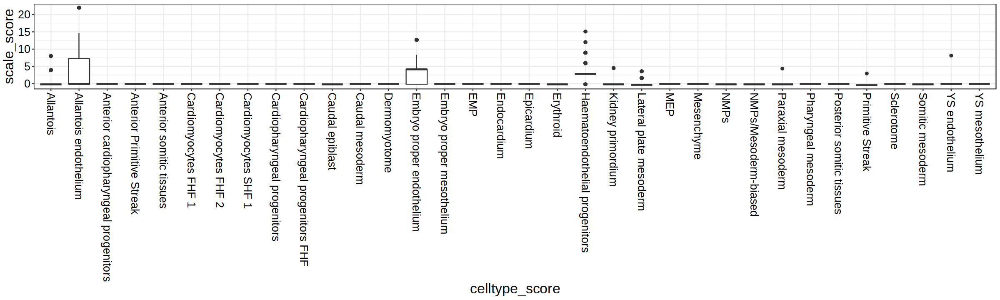

In [110]:
options(repr.plot.width=20, repr.plot.height=6)

ggplot(scores[celltype=='Allantois endothelium'], aes(celltype_score, scale_score)) + 
   # geom_point() + 
    geom_boxplot() + 
      theme_bw() + 
        theme(text=element_text(size=20),
              axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5, color='black'),
              axis.text.y=element_text(color='black'))

In [118]:
scores_cells.dt = scores[,minmax_score:=minmax(score), by='celltype_score'] %>%
    .[order(-minmax_score)] %>%
    unique(by=c('cell', 'celltype'))

In [119]:
props = as.data.table(table(scores_cells.dt$celltype, scores_cells.dt$celltype_score)) %>%
    setnames(c('celltype', 'celltype_score', 'N')) %>%
    .[,Nsum:=sum(N), by='celltype'] %>%
    .[,prop:=round(N/Nsum,2)]

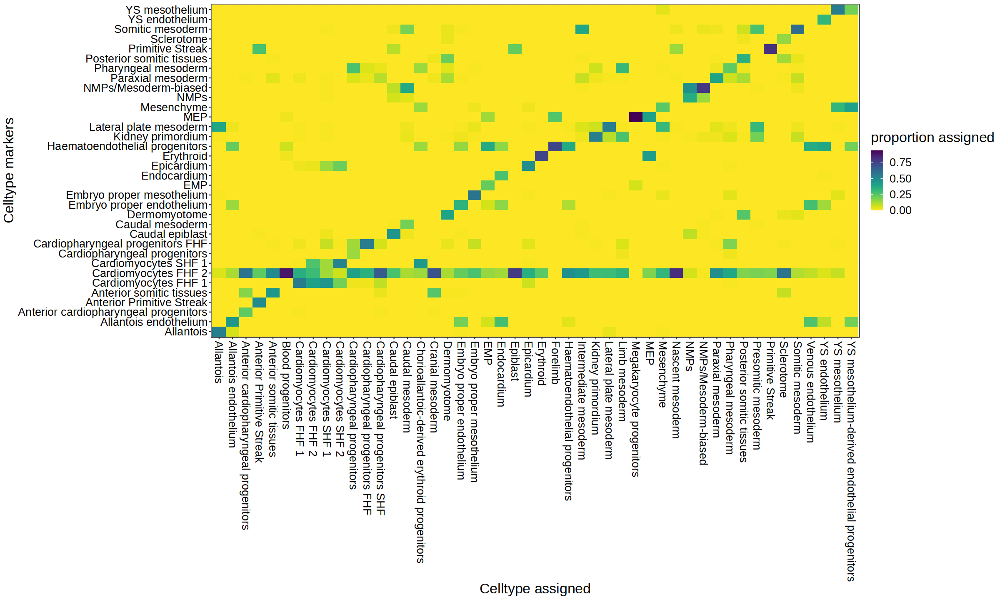

In [120]:
options(repr.plot.width=20, repr.plot.height=12)

ggplot(props[!is.na(prop)], aes(celltype, celltype_score, fill=prop)) + 
      geom_tile() + 
      viridis::scale_fill_viridis(begin=1, end=0, name = 'proportion assigned') + 
      xlab('Celltype assigned') + ylab('Celltype markers') +
      theme_bw() + 
        theme(text=element_text(size=20),
              axis.text.x=element_text(angle=-90, hjust=0, vjust=0.5, color='black'),
              axis.text.y=element_text(color='black'))

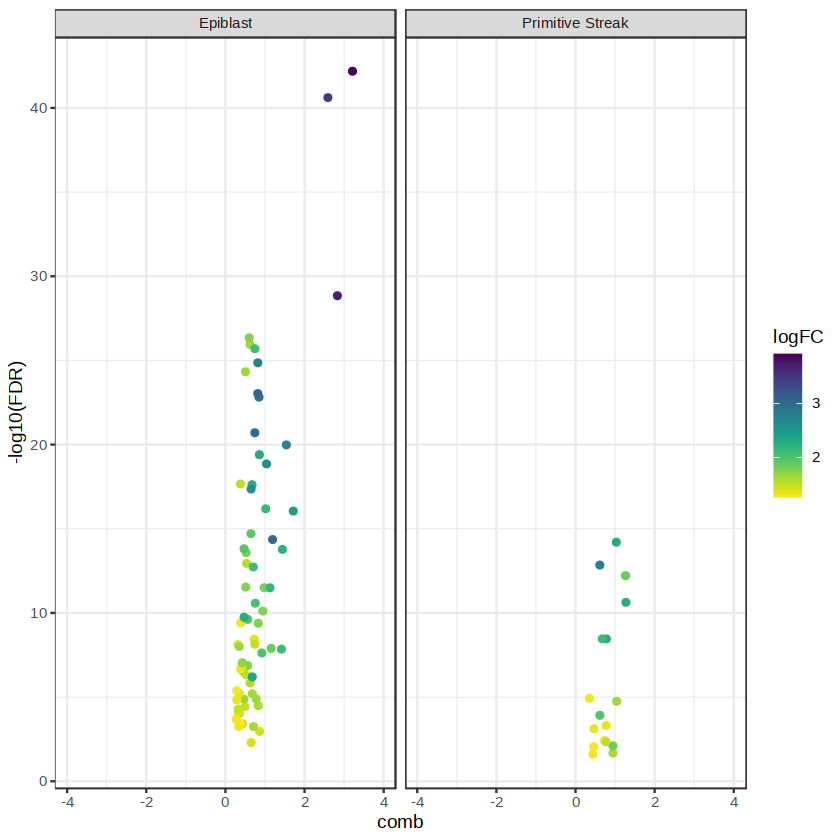

In [184]:
ggplot(out4, aes(comb, -log10(FDR), col=logFC)) + 
    geom_point() +
    viridis::scale_color_viridis(begin=1, end=0) +
    xlim(-max(abs(DEGs$logFC)), max(abs(DEGs$logFC))) + 
    facet_wrap(~celltype) + 
    theme_bw()

In [125]:
original.sce

class: SingleCellExperiment 
dim: 17109 72845 
metadata(0):
assays(1): counts
rownames(17109): Xkr4 Sox17 ... mt-Nd6 mt-Cytb
rowData names(0):
colnames(72845): cell_1 cell_2 ... cell_139329 cell_139330
colData names(19): cell sample ... celltype_extended_atlas sizeFactor
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [127]:
library(Seurat)

Attaching SeuratObject


Attaching package: ‘Seurat’


The following object is masked from ‘package:SummarizedExperiment’:

    Assays




In [132]:
original.sce

class: SingleCellExperiment 
dim: 17109 72845 
metadata(0):
assays(2): counts logcounts
rownames(17109): Xkr4 Sox17 ... mt-Nd6 mt-Cytb
rowData names(0):
colnames(72845): cell_1 cell_2 ... cell_139329 cell_139330
colData names(19): cell sample ... celltype_extended_atlas sizeFactor
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [156]:
seurat = as.Seurat(original.sce, counts = "counts", data='counts')

In [157]:
seurat = NormalizeData(seurat)

In [194]:
test_genes = out4[celltype=='Allantois',] %>%
        .[order(-logFC)] %>% 
        .[logFC>0] %>%
        head(100) %>% 
        .$gene

In [195]:
features = list(c('Tbx4','Hoxa11','Nxf7','Hoxa10','Pitx1','Hoxc10','Plac1','Twist2','Phlda2','Spin2c','Ngfr','Perp','Hoxa9','Pde9a','Nup62cl'))

In [189]:
features

[[1]]
 [1] "Tbx4"    "Hoxa11"  "Nxf7"    "Hoxa10"  "Pitx1"   "Hoxc10"  "Plac1"  
 [8] "Twist2"  "Phlda2"  "Spin2c"  "Ngfr"    "Perp"    "Hoxa9"   "Pde9a"  
[15] "Nup62cl"

In [200]:
getwd()

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code/rna/marker_scores"

In [196]:
test = list(test_genes)
test

[[1]]
  [1] "Tbx4"     "Hoxa11"   "Nxf7"     "Hoxa10"   "Pitx1"    "Hoxc10"  
  [7] "Plac1"    "Twist2"   "Phlda2"   "Spin2c"   "Ngfr"     "Perp"    
 [13] "Hoxa9"    "Pde9a"    "Nup62cl"  "Hoxc9"    "Gjb3"     "Col1a1"  
 [19] "Pgf"      "Morc4"    "Mettl7a1" "Cdkn1c"   "Sgce"     "Amot"    
 [25] "Hoxa7"    "Tmem119"  "Pdgfa"    "Gfpt2"    "Rnf128"   "Tbx3"    
 [31] "Peg10"    "Slc38a4"  "Mbnl3"    "Tbx20"    "Rgs5"     "Snai1"   
 [37] "Ppfibp2"  "Pcgf5"    "Plekhf1"  "Smad6"    "Hoxc8"    "Efnb1"   
 [43] "Prdm6"    "Cox4i2"   "Suv39h1"  "Rhox5"    "Capn6"    "Hand1"   
 [49] "Cd44"     "Asb4"     "Dlk1"     "Stbd1"    "Hoxc6"    "Cables2" 
 [55] "Hoxb6"    "Hoxd9"    "Efnb3"    "Pcolce"   "Ccdc80"   "Smad7"   
 [61] "Gata5"    "Col1a2"   "Phldb2"   "Krt8"     "Msx2"     "Igf2r"   
 [67] "Rbpms2"   "Tmem158"  "Bmp4"     "Ugdh"     "Cntfr"    "Ppp1r14a"
 [73] "Kitl"     "P4ha2"    "Bves"     "Unc5b"    "Krt19"    "Sct"     
 [79] "Pmp22"    "Msx1"     "Bambi"    "Arid5b"   "Gata4"    "Itm2a"   
 [85] "Vegfc"    "Hoxb7"    "Efemp2"   "Apela"    "Wnt5a"    "Lgals1"  
 [91] "Apbb1"    "Tex264"   "Tmem88"   "Smarca1"  "Oat"      "Klf6"    
 [97] "Rhou"     "Hand2"    "Twist1"   "Ppic"

In [210]:
test = colData(extended.sce)

In [222]:
args$celltypes

"Epiblast" 
                                                 
                              "Primitive Streak" 
                                                 
                               "Caudal epiblast" 
                                             PGC 
                                       "#FACB12" 
                                                 
                     "Anterior Primitive Streak" 
                                                 
                              "Nascent mesoderm" 
                                                 
                         "Intermediate mesoderm" 
                                                 
                               "Caudal mesoderm" 
                                                 
                        "Lateral plate mesoderm" 
                                                 
                                 "Limb mesoderm" 
                                                 
                                      "Forelimb" 
                                                 
                             "Kidney primordium" 
                                                 
                           "Presomitic mesoderm" 
                                                 
                              "Somitic mesoderm" 
                                                 
                     "Posterior somitic tissues" 
                                                 
                             "Paraxial mesoderm" 
                                                 
                              "Cranial mesoderm" 
                                                 
                      "Anterior somitic tissues" 
                                                 
                                    "Sclerotome" 
                                                 
                                  "Dermomyotome" 
                                                 
                           "Pharyngeal mesoderm" 
                                                 
                  "Cardiopharyngeal progenitors" 
                                                 
         "Anterior cardiopharyngeal progenitors" 
                                                 
                                     "Allantois" 
                                                 
                                    "Mesenchyme" 
                                                 
                                "YS mesothelium" 
                                                 
                                    "Epicardium" 
                                                 
                     "Embryo proper mesothelium" 
                                                 
              "Cardiopharyngeal progenitors FHF" 
                                                 
                          "Cardiomyocytes FHF 1" 
                                                 
                          "Cardiomyocytes FHF 2" 
                                                 
              "Cardiopharyngeal progenitors SHF" 
                                                 
                          "Cardiomyocytes SHF 1" 
                                                 
                          "Cardiomyocytes SHF 2" 
                                                 
                "Haematoendothelial progenitors" 
                                                 
                             "Blood progenitors" 
                                                 
                                     "Erythroid" 
                                                 
 "Chorioallantoic-derived erythroid progenitors" 
                                                 
                     "Megakaryocyte progenitors" 
                                                 
                                           "MEP" 
                                                 
                                      

In [227]:
as.vector(gsub(' ', '_', gsub('/', '_', args$celltypes)))

[1] "Epiblast"                                      
 [2] "Primitive_Streak"                              
 [3] "Caudal_epiblast"                               
 [4] "PGC"                                           
 [5] "Anterior_Primitive_Streak"                     
 [6] "Nascent_mesoderm"                              
 [7] "Intermediate_mesoderm"                         
 [8] "Caudal_mesoderm"                               
 [9] "Lateral_plate_mesoderm"                        
[10] "Limb_mesoderm"                                 
[11] "Forelimb"                                      
[12] "Kidney_primordium"                             
[13] "Presomitic_mesoderm"                           
[14] "Somitic_mesoderm"                              
[15] "Posterior_somitic_tissues"                     
[16] "Paraxial_mesoderm"                             
[17] "Cranial_mesoderm"                              
[18] "Anterior_somitic_tissues"                      
[19] "Sclerotome"                                    
[20] "Dermomyotome"                                  
[21] "Pharyngeal_mesoderm"                           
[22] "Cardiopharyngeal_progenitors"                  
[23] "Anterior_cardiopharyngeal_progenitors"         
[24] "Allantois"                                     
[25] "Mesenchyme"                                    
[26] "YS_mesothelium"                                
[27] "Epicardium"                                    
[28] "Embryo_proper_mesothelium"                     
[29] "Cardiopharyngeal_progenitors_FHF"              
[30] "Cardiomyocytes_FHF_1"                          
[31] "Cardiomyocytes_FHF_2"                          
[32] "Cardiopharyngeal_progenitors_SHF"              
[33] "Cardiomyocytes_SHF_1"                          
[34] "Cardiomyocytes_SHF_2"                          
[35] "Haematoendothelial_progenitors"                
[36] "Blood_progenitors"                             
[37] "Erythroid"                                     
[38] "Chorioallantoic-derived_erythroid_progenitors" 
[39] "Megakaryocyte_progenitors"                     
[40] "MEP"                                           
[41] "EMP"                                           
[42] "YS_endothelium"                                
[43] "YS_mesothelium-derived_endothelial_progenitors"
[44] "Allantois_endothelium"                         
[45] "Embryo_proper_endothelium"                     
[46] "Venous_endothelium"                            
[47] "Endocardium"                                   
[48] "NMPs_Mesoderm-biased"                          
[49] "NMPs"

In [220]:
colData(extended.sce)$celltype_extended_atlas = gsub(' ', '_', gsub('/', '_', colData(extended.sce)$celltype_extended_atlas))

In [221]:
head(colData(extended.sce))

DataFrame with 6 rows and 18 columns
           cell    sample embryo_version    stage
       <factor> <integer>       <factor> <factor>
cell_1   cell_1         1       Original     E6.5
cell_2   cell_2         1       Original     E6.5
cell_5   cell_5         1       Original     E6.5
cell_6   cell_6         1       Original     E6.5
cell_8   cell_8         1       Original     E6.5
cell_9   cell_9         1       Original     E6.5
       stage_mixed_gastrulation_mapped           somite_count     anatomy
                              <factor>            <character> <character>
cell_1                            E6.5 PooledEPooled6Pooled..      Pooled
cell_2                            E6.5 PooledEPooled6Pooled..      Pooled
cell_5                            E6.5 PooledEPooled6Pooled..      Pooled
cell_6                            E6.5 PooledEPooled6Pooled..      Pooled
cell_8                            E6.5 PooledEPooled6Pooled..      Pooled
cell_9                            E6.5 Pooled

In [204]:
head(colData(extended.sce))

DataFrame with 6 rows and 18 columns
           cell    sample embryo_version    stage
       <factor> <integer>       <factor> <factor>
cell_1   cell_1         1       Original     E6.5
cell_2   cell_2         1       Original     E6.5
cell_5   cell_5         1       Original     E6.5
cell_6   cell_6         1       Original     E6.5
cell_8   cell_8         1       Original     E6.5
cell_9   cell_9         1       Original     E6.5
       stage_mixed_gastrulation_mapped           somite_count     anatomy
                              <factor>            <character> <character>
cell_1                            E6.5 PooledEPooled6Pooled..      Pooled
cell_2                            E6.5 PooledEPooled6Pooled..      Pooled
cell_5                            E6.5 PooledEPooled6Pooled..      Pooled
cell_6                            E6.5 PooledEPooled6Pooled..      Pooled
cell_8                            E6.5 PooledEPooled6Pooled..      Pooled
cell_9                            E6.5 Pooled

In [203]:
test = gsub(' ', '_', gsub('/', '_', args$celltypes))
test

"Epiblast" 
                                                 
                              "Primitive_Streak" 
                                                 
                               "Caudal_epiblast" 
                                             PGC 
                                       "#FACB12" 
                                                 
                     "Anterior_Primitive_Streak" 
                                                 
                              "Nascent_mesoderm" 
                                                 
                         "Intermediate_mesoderm" 
                                                 
                               "Caudal_mesoderm" 
                                                 
                        "Lateral_plate_mesoderm" 
                                                 
                                 "Limb_mesoderm" 
                                                 
                                      "Forelimb" 
                                                 
                             "Kidney_primordium" 
                                                 
                           "Presomitic_mesoderm" 
                                                 
                              "Somitic_mesoderm" 
                                                 
                     "Posterior_somitic_tissues" 
                                                 
                             "Paraxial_mesoderm" 
                                                 
                              "Cranial_mesoderm" 
                                                 
                      "Anterior_somitic_tissues" 
                                                 
                                    "Sclerotome" 
                                                 
                                  "Dermomyotome" 
                                                 
                           "Pharyngeal_mesoderm" 
                                                 
                  "Cardiopharyngeal_progenitors" 
                                                 
         "Anterior_cardiopharyngeal_progenitors" 
                                                 
                                     "Allantois" 
                                                 
                                    "Mesenchyme" 
                                                 
                                "YS_mesothelium" 
                                                 
                                    "Epicardium" 
                                                 
                     "Embryo_proper_mesothelium" 
                                                 
              "Cardiopharyngeal_progenitors_FHF" 
                                                 
                          "Cardiomyocytes_FHF_1" 
                                                 
                          "Cardiomyocytes_FHF_2" 
                                                 
              "Cardiopharyngeal_progenitors_SHF" 
                                                 
                          "Cardiomyocytes_SHF_1" 
                                                 
                          "Cardiomyocytes_SHF_2" 
                                                 
                "Haematoendothelial_progenitors" 
                                                 
                             "Blood_progenitors" 
                                                 
                                     "Erythroid" 
                                                 
 "Chorioallantoic-derived_erythroid_progenitors" 
                                                 
                     "Megakaryocyte_progenitors" 
                                                 
                                           "MEP" 
                                                 
                                      

In [197]:
seurat = AddModuleScore(seurat, 
               features = list(test_genes),
              name='Allantois_score')

In [198]:
colnames(seurat@meta.data)

[1] "orig.ident"                                     
 [2] "nCount_originalexp"                             
 [3] "nFeature_originalexp"                           
 [4] "cell"                                           
 [5] "sample"                                         
 [6] "embryo_version"                                 
 [7] "stage"                                          
 [8] "stage_mixed_gastrulation_mapped"                
 [9] "somite_count"                                   
[10] "anatomy"                                        
[11] "S_score"                                        
[12] "G2M_score"                                      
[13] "phase"                                          
[14] "r_louvain_clus"                                 
[15] "r_louvain_subclus"                              
[16] "louvain"                                        
[17] "leiden"                                         
[18] "celltype_PijuanSala2019"                        
[19] "celltype_PijuanSala2019_E85mapped"              
[20] "celltype_PijuanSala2019_E85mapped_WOTdescendant"
[21] "celltype_extended_atlas"                        
[22] "sizeFactor"                                     
[23] "Allantois_score1"

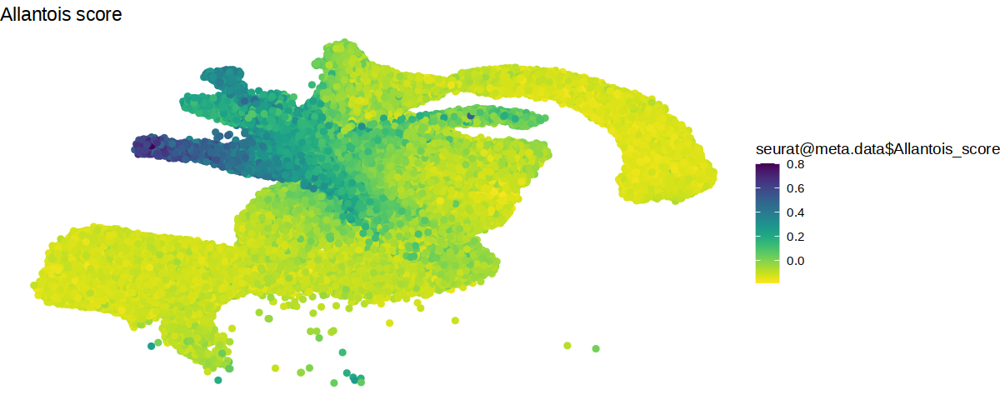

In [199]:
options(repr.plot.width=10, repr.plot.height=4)

ggplot(umap, aes(umap1, umap2, col=seurat@meta.data$Allantois_score1)) +
        geom_point() + 
        viridis::scale_color_viridis(begin=1, end=0) + 
        ggtitle('Allantois score') + 
        theme_void()

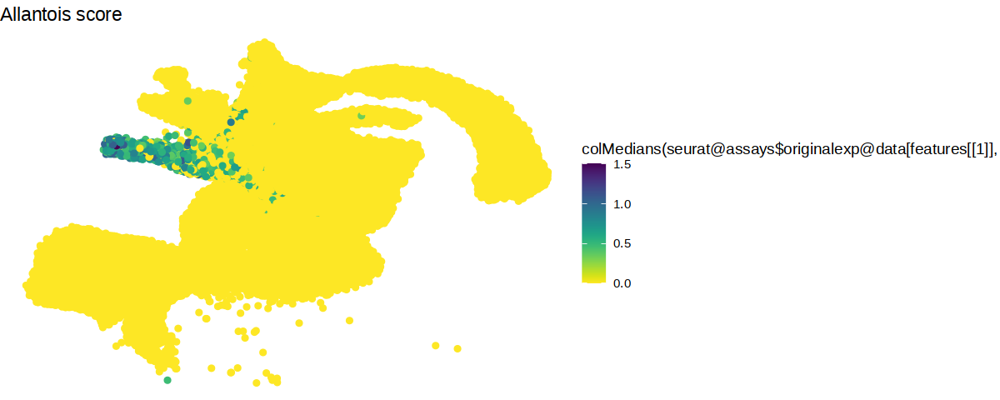

In [178]:
ggplot(umap, aes(umap1, umap2, col=colMedians(seurat@assays$originalexp@data[features[[1]],]))) +
        geom_point() + 
        viridis::scale_color_viridis(begin=1, end=0) + 
        ggtitle('Allantois score') + 
        theme_void()

In [228]:
getwd()

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code/rna/marker_scores"

In [253]:
test = fread('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna/marker_scores/celltype_extended_markers_Cardiopharyngeal_progenitors.txt.gz')
head(test[order(-logFC)][sig==TRUE], 10)

gene,logFC,logCPM,F,PValue,FDR,sig,celltype,cdr,cdr_bg
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>
Nlrp6,4.392829,0.768997,23.08495,2.114671e-06,0.01269363,TRUE,Cardiopharyngeal_progenitors,0.08,0.00
Ppp2r2b,4.031307,1.402033,22.06423,3.437693e-06,0.01269363,TRUE,Cardiopharyngeal_progenitors,0.16,0.01
Ino80e,-1.430784,6.845303,18.59400,1.956790e-05,0.03363163,TRUE,Cardiopharyngeal_progenitors,0.49,0.70
Tfb2m,-2.398612,5.216371,21.41771,3.218659e-05,0.04840460,TRUE,Cardiopharyngeal_progenitors,0.10,0.33
Gpr180,-2.524483,5.747038,18.85832,1.712273e-05,0.03363163,TRUE,Cardiopharyngeal_progenitors,0.25,0.39
Noct,-7.585101,4.402418,20.61522,7.546335e-06,0.01815799,TRUE,Cardiopharyngeal_progenitors,0.02,0.22


In [271]:
test = fread('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna/marker_scores/celltype_extended_markers_NMPs.txt.gz')
head(test, 10)

gene,logFC,logCPM,F,PValue,FDR,sig,celltype,cdr,cdr_bg
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>
Fgfbp3,3.6597252,3.5985334,144.18826,2.809304e-29,3.379874e-25,TRUE,NMPs,0.50,0.06
Fezf2,4.0685717,0.7222257,124.34715,1.817375e-25,1.093242e-21,TRUE,NMPs,0.07,0.00
Pmaip1,3.5589003,5.1702492,118.75025,6.939740e-25,2.783067e-21,TRUE,NMPs,0.47,0.35
Hes3,4.5928546,4.0077266,111.34449,2.040163e-23,6.136300e-20,TRUE,NMPs,0.82,0.04
Prap1,3.4047789,0.5877915,87.16149,7.850987e-19,1.889104e-15,TRUE,NMPs,0.04,0.00
Ubald2,-1.2744807,7.7072777,83.85205,1.454663e-18,2.916841e-15,TRUE,NMPs,0.55,0.85
Cystm1,3.2129658,4.4076543,81.14844,4.799636e-18,8.249203e-15,TRUE,NMPs,0.76,0.16
Hn1l,0.7473511,7.5716195,78.41529,1.540373e-17,2.316528e-14,FALSE,NMPs,0.92,0.84
Neurog2,3.3689922,0.7158617,77.39339,2.862581e-17,3.826634e-14,TRUE,NMPs,0.04,0.00


In [272]:
colnames(test)

[1] "gene"     "logFC"    "logCPM"   "F"        "PValue"   "FDR"     
 [7] "sig"      "celltype" "cdr"      "cdr_bg"

In [276]:
data.table('gene'=NA,'logFC'=NA,'logCPM'=NA,'F'=NA,'PValue'=NA, 'FDR'=NA,'sig'=NA,'celltype'=NA,'cdr'=NA,'cdr_bg'=NA)

gene,logFC,logCPM,F,PValue,FDR,sig,celltype,cdr,cdr_bg
<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>,<lgl>
NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


In [235]:
list.files('/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna/marker_scores/')

[1] 47

In [247]:
loc = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna/marker_scores/'
DEGs_all = lapply(file.path(loc, list.files(loc)), fread) #%>%
    #rbindlist()

Warning message in FUN(X[[i]], ...):
“Detected 1 column names but the data has 2 columns (i.e. invalid file). Added 1 extra default column name for the first column which is guessed to be row names or an index. Use setnames() afterwards if this guess is not correct, or fix the file write command that created the file to create a valid file.”
Warning message in FUN(X[[i]], ...):
“Stopped early on line 35. Expected 2 fields but found 3. Consider fill=TRUE and comment.char=. First discarded non-empty line: <<Tz<dc>w<91><c2>ʆXz7<b9>}<fa>)B<db>E	u<a6>+`s<b4><ff>R<b9><bf>=^<b0><ee><e2><8b>?"yu<c6><f5><b4><fe> <ad><81>k<a5>8<8a><b4>>>”


In [249]:
length(DEGs_all)

[1] 47

In [260]:
meta[celltype_extended_atlas=='Forelimb']

cell,sample,embryo_version,stage,stage_mixed_gastrulation_mapped,somite_count,anatomy,S_score,G2M_score,phase,r_louvain_clus,r_louvain_subclus,louvain,leiden,celltype_PijuanSala2019,celltype_PijuanSala2019_E85mapped,celltype_PijuanSala2019_E85mapped_WOTdescendant,celltype_extended_atlas
<fct>,<int>,<fct>,<fct>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<int>,<int>,<int>,<int>,<chr>,<chr>,<fct>,<fct>
cell_76303,25,Original,E8.25,E8.25,PooledEPooled8Pooled.Pooled2Pooled5Pooled,Pooled,0.3249149,0.2975685,S,4,2,3,50,Haematoendothelial progenitors,Haematoendothelial progenitors,Haematoendothelial progenitors,Forelimb
cell_92842,28,Original,E8.25,E8.25,PooledEPooled8Pooled.Pooled2Pooled5Pooled,Pooled,0.1998635,0.2645358,G2M,4,7,9,50,Blood progenitors 1,Blood progenitors 1,Blood progenitors 1,Forelimb
cell_94351,28,Original,E8.25,E8.25,PooledEPooled8Pooled.Pooled2Pooled5Pooled,Pooled,0.3608584,0.3973177,G2M,4,7,9,50,Blood progenitors 1,Blood progenitors 1,Blood progenitors 1,Forelimb
cell_95873,29,Original,E8.5,E8.5,PooledEPooled8Pooled.Pooled5Pooled,Pooled,0.4133930,0.5526890,G2M,4,7,9,50,Blood progenitors 1,Blood progenitors 1,Blood progenitors 1,Forelimb


In [261]:
nrow(meta[celltype_extended_atlas=='Forelimb'])

[1] 4

In [262]:
test = as.data.frame(meta)

In [265]:
head(test)

,cell,sample,embryo_version,stage,stage_mixed_gastrulation_mapped,somite_count,anatomy,S_score,G2M_score,phase,r_louvain_clus,r_louvain_subclus,louvain,leiden,celltype_PijuanSala2019,celltype_PijuanSala2019_E85mapped,celltype_PijuanSala2019_E85mapped_WOTdescendant,celltype_extended_atlas
,<fct>,<int>,<fct>,<fct>,<fct>,<chr>,<chr>,<dbl>,<dbl>,<fct>,<int>,<int>,<int>,<int>,<chr>,<chr>,<fct>,<fct>
1,cell_1,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,0.1717105,0.4300413,G2M,7,5,0,6,Epiblast,Epiblast,Epiblast,Epiblast
2,cell_2,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,0.7101008,0.1834096,S,7,6,1,38,Primitive Streak,Primitive Streak,Primitive Streak,Primitive Streak
3,cell_6,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,0.4660223,0.2468976,S,7,2,3,3,Epiblast,Epiblast,Epiblast,Epiblast
4,cell_8,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,0.3464951,0.4098396,G2M,7,1,4,6,Epiblast,Epiblast,Epiblast,Epiblast
5,cell_9,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,0.3482208,0.5135100,G2M,7,1,4,6,Epiblast,Epiblast,Epiblast,Epiblast
6,cell_10,1,Original,E6.5,E6.5,PooledEPooled6Pooled.Pooled5Pooled,Pooled,0.3276732,0.5553277,G2M,7,7,1,3,Epiblast,Epiblast,Epiblast,Epiblast


In [267]:
nrow(test[test$celltype_extended_atlas=='Forelimb',])

[1] 4

In [ ]:
if(nrow(colData(summed.filt)[colData(summed.filt)$celltype_extended_atlas,])>2){
    
}

In [269]:
if(nrow(test[test$celltype_extended_atlas=='Forelimb',])>2){
    print('a')
}

[1] "a"


In [258]:
summed.filt

ERROR: Error in eval(expr, envir, enclos): object 'summed.filt' not found


In [246]:
head(DEGs_all)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'DEGs_all' not found
